In [1]:
using Pkg
Pkg.add("DataFrames")
Pkg.add("CSV")
Pkg.add("Statistics")
Pkg.add("MLDataUtils")
Pkg.add("Impute")
Pkg.add("Plots")
Pkg.add("Lathe")
Pkg.add("GLM")
Pkg.add("StatsPlots")
Pkg.add("MLBase")

using DataFrames
using CSV
using MLDataUtils
using Impute
using Plots
using Lathe
using GLM
using Statistics
using StatsPlots
using MLBase

┌ Warning: could not download https://pkg.julialang.org/registries
│   exception = RequestError: HTTP/2 301 (Cert verify failed: BADCERT_NOT_TRUSTED) while requesting https://pkg.julialang.org/registries
└ @ Pkg.Registry ~/julia-1.9.3/share/julia/stdlib/v1.9/Pkg/src/Registry/Registry.jl:69
   Resolving package versions...
  No Changes to `~/Project.toml`
  No Changes to `~/Manifest.toml`
   Resolving package versions...
  No Changes to `~/Project.toml`
  No Changes to `~/Manifest.toml`
   Resolving package versions...
  No Changes to `~/Project.toml`
  No Changes to `~/Manifest.toml`
   Resolving package versions...
  No Changes to `~/Project.toml`
  No Changes to `~/Manifest.toml`
   Resolving package versions...
  No Changes to `~/Project.toml`
  No Changes to `~/Manifest.toml`
   Resolving package versions...
  No Changes to `~/Project.toml`
  No Changes to `~/Manifest.toml`
   Resolving package versions...
  No Changes to `~/Project.toml`
  No Changes to `~/Manifest.toml`
   Resolv

In [20]:
bank= CSV.read("/home/ilke/Downloads/processed_data1.csv", DataFrame)

,age,job,marital,education,default,balance,housing,loan,contact
,Int64,String15,String15,String15,String3,Int64,String3,String3,String15
1,58,management,married,tertiary,no,2143,yes,no,unknown
2,44,technician,single,secondary,no,29,yes,no,unknown
3,33,entrepreneur,married,secondary,no,2,yes,yes,unknown
4,47,blue-collar,married,unknown,no,1506,yes,no,unknown
5,33,unknown,single,unknown,no,1,no,no,unknown
6,35,management,married,tertiary,no,231,yes,no,unknown
7,28,management,single,tertiary,no,447,yes,yes,unknown
8,42,entrepreneur,divorced,tertiary,yes,2,yes,no,unknown
9,58,retired,married,primary,no,121,yes,no,unknown


## Lojistik regresyon

In [21]:
using Lathe.preprocess: TrainTestSplit
train,test=TrainTestSplit(bank,.75)

(33755×18 DataFrame
   Row │ age    job           marital   education  default  balance  housing   ⋯
       │ Int64  String15      String15  String15   String3  Int64    String3   ⋯
───────┼────────────────────────────────────────────────────────────────────────
     1 │    58  management    married   tertiary   no          2143  yes       ⋯
     2 │    33  unknown       single    unknown    no             1  no
     3 │    35  management    married   tertiary   no           231  yes
     4 │    28  management    single    tertiary   no           447  yes
     5 │    42  entrepreneur  divorced  tertiary   yes            2  yes       ⋯
     6 │    58  retired       married   primary    no           121  yes
     7 │    43  technician    single    secondary  no           593  yes
     8 │    41  admin.        divorced  secondary  no           270  yes
     9 │    29  admin.        single    secondary  no           390  yes       ⋯
    10 │    53  technician    married   secondary  no    

In [22]:
#Build Model
fm=@formula(y_numeric~age+job+marital+education+default+balance+housing+loan+contact+day+month+duration+campaign+pdays+previous+poutcome)
logit=glm(fm,train,Binomial(),LogitLink())

StatsModels.TableRegressionModel{GeneralizedLinearModel{GLM.GlmResp{Vector{Float64}, Binomial{Float64}, LogitLink}, GLM.DensePredChol{Float64, LinearAlgebra.CholeskyPivoted{Float64, Matrix{Float64}, Vector{Int64}}}}, Matrix{Float64}}

y_numeric ~ 1 + age + job + marital + education + default + balance + housing + loan + contact + day + month + duration + campaign + pdays + previous + poutcome

Coefficients:
─────────────────────────────────────────────────────────────────────────────────────────────
                             Coef.   Std. Error       z  Pr(>|z|)     Lower 95%     Upper 95%
─────────────────────────────────────────────────────────────────────────────────────────────
(Intercept)           -2.31168      0.211773     -10.92    <1e-27  -2.72674      -1.89661
age                   -0.00323834   0.00255776    -1.27    0.2055  -0.00825145    0.00177477
job: blue-collar      -0.334936     0.0845862     -3.96    <1e-04  -0.500722     -0.16915
job: entrepreneur     -0.379092   

In [23]:
#Build Model
fm=@formula(y_numeric~age+job+marital+education+default+balance+housing+loan+contact+day+month+duration+campaign+pdays+previous+poutcome)
logit=glm(fm,train,Binomial(),LogitLink())

StatsModels.TableRegressionModel{GeneralizedLinearModel{GLM.GlmResp{Vector{Float64}, Binomial{Float64}, LogitLink}, GLM.DensePredChol{Float64, LinearAlgebra.CholeskyPivoted{Float64, Matrix{Float64}, Vector{Int64}}}}, Matrix{Float64}}

y_numeric ~ 1 + age + job + marital + education + default + balance + housing + loan + contact + day + month + duration + campaign + pdays + previous + poutcome

Coefficients:
─────────────────────────────────────────────────────────────────────────────────────────────
                             Coef.   Std. Error       z  Pr(>|z|)     Lower 95%     Upper 95%
─────────────────────────────────────────────────────────────────────────────────────────────
(Intercept)           -2.31168      0.211773     -10.92    <1e-27  -2.72674      -1.89661
age                   -0.00323834   0.00255776    -1.27    0.2055  -0.00825145    0.00177477
job: blue-collar      -0.334936     0.0845862     -3.96    <1e-04  -0.500722     -0.16915
job: entrepreneur     -0.379092   

In [26]:
predictions=predict(logit,test)

11456-element Vector{Union{Missing, Float64}}:
 0.008575809799411601
 0.002729011543742139
 0.004428609183699415
 0.006673628603627035
 0.021663635065122325
 0.012062315115762147
 0.008255992850365773
 0.004185784068212884
 0.014862811293871594
 0.018700922065100847
 0.011055740766361637
 0.0073664902788463165
 0.014650241966499118
 ⋮
 0.1859095496467942
 0.07457784355625316
 0.04045531947603506
 0.4372874048986251
 0.29235329906134694
 0.7183290198087544
 0.05440138534522727
 0.10183290155026387
 0.19817766495208805
 0.17315088619211777
 0.6414035450531018
 0.12624324858299113

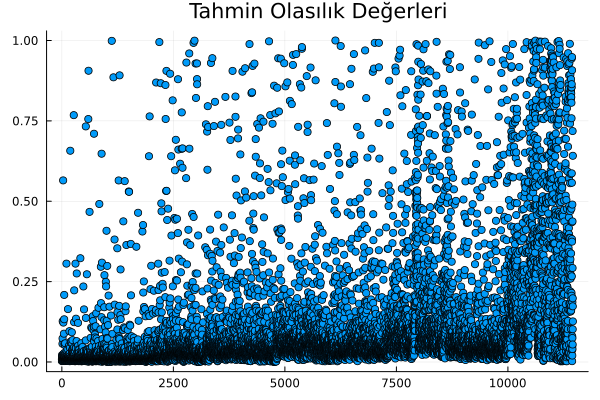

In [27]:
scatter(predictions, title="Tahmin Olasılık Değerleri",legend=false)

In [28]:
prediction_class=[if x<0.5 0 else 1 end for x in predictions]

11456-element Vector{Int64}:
 0
 0
 0
 0
 0
 0
 0
 0
 0
 0
 0
 0
 0
 ⋮
 0
 0
 0
 0
 0
 1
 0
 0
 0
 0
 1
 0

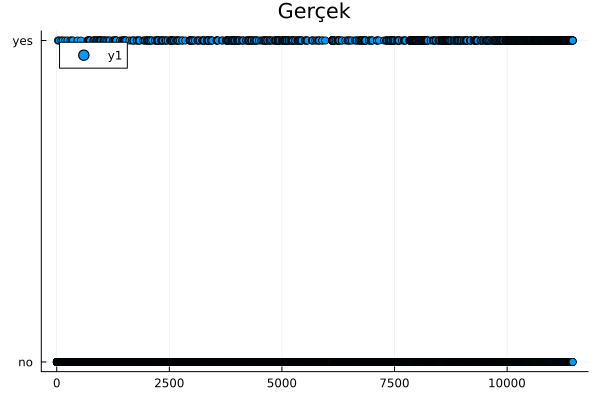

In [29]:
scatter(test[!,:y], title="Gerçek")

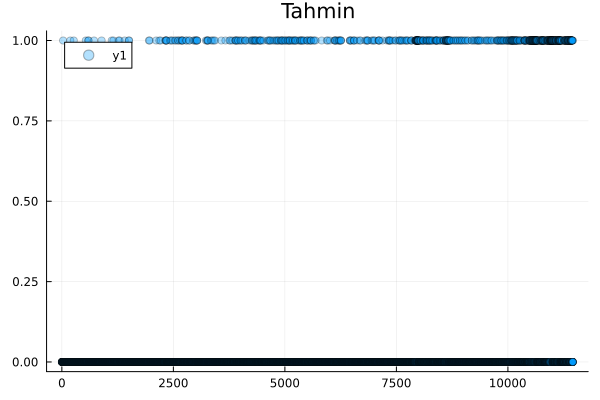

In [30]:
scatter(prediction_class, opacity=0.3, title="Tahmin")

In [31]:
prediction_df=DataFrame(y_actual=test.y_numeric,prob_predicted=predictions,y_predicted=prediction_class)

,y_actual,prob_predicted,y_predicted
,Int64,Float64?,Int64
1,0,0.00857581,0
2,0,0.00272901,0
3,0,0.00442861,0
4,0,0.00667363,0
5,0,0.0216636,0
6,0,0.0120623,0
7,0,0.00825599,0
8,0,0.00418578,0
9,0,0.0148628,0


In [32]:
confusion_matrix=MLBase.roc(prediction_df.y_actual,prediction_df.y_predicted)

ROCNums{Int64}
  p = 1309
  n = 10147
  tp = 452
  tn = 9896
  fp = 251
  fn = 857


In [33]:
accuracy(cm)=(cm.tp+cm.tn)/(cm.tp+cm.tn+cm.fp+cm.fn)
specificity(cm)=cm.tn/(cm.tn+cm.fp)
precision(cm)=cm.tp/(cm.tp+cm.fp)
recall(cm)=cm.tp/(cm.tp+cm.fn)
F1score(cm)=2*cm.tp/(2*cm.tp+cm.fp+cm.fn)

F1score (generic function with 1 method)

In [34]:
println("Accuracy: ",accuracy(confusion_matrix))
println("Specificity: ",specificity(confusion_matrix))
println("Precision: ",precision(confusion_matrix))
println("Recall: ",recall(confusion_matrix))
println("F1Score: ",F1score(confusion_matrix))

Accuracy: 0.903282122905028
Specificity: 0.9752636247166651
Precision: 0.6429587482219061
Recall: 0.34530175706646293
F1Score: 0.44930417495029823
